In [1]:
#importing the libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import math


In [2]:
#defining the Haar wavelet along both the x-axis and y-axis
def Haar_wavelet(sigma):
    size = math.ceil(4*sigma)
    size = size + size%2
    Hy = np.ones((size,size))
    Hy[size//2:size,:] = -1
    return Hy,-Hy.T
    

In [3]:
#defining the Harris Corner Detector
def Harris(sigma,oimg):
    Hy,Hx = Haar_wavelet(sigma)
    img = oimg/255.0
    dx = cv2.filter2D(img,-1,Hx)
    dy = cv2.filter2D(img,-1,Hy)
    
    ksize = math.ceil(5*sigma)
    ksize = ksize + ksize%2
    window = np.ones((ksize,ksize))
    
    dx2 = cv2.filter2D(dx*dx,-1,window)
    dy2 = cv2.filter2D(dy*dy,-1,window)
    dxdy = cv2.filter2D(dx*dy,-1,window)
    
    det = dx2*dy2 - (dxdy)**2
    trace = dx2 + dy2
    ratio  = det/((trace)**2+0.0001)
    
    thresh = (ratio.sum())/(img.shape[0]*img.shape[1])
    new_ratio = det - ((trace)**2)*(thresh)
    new_ratio[new_ratio<0] = 0
    new_thresh = np.sort(new_ratio.flatten())[-200] #taking the top 200 points 
    
    ks2 = ksize//2
    
    coords = []

    for y in range(ks2,img.shape[0]-ks2):
        for x in range(ks2,img.shape[1]-ks2):
            temp = new_ratio[y-ks2:y+ks2,x-ks2:x+ks2]
            if new_ratio[y,x] == temp.max() and temp.max()>new_thresh:
                coords.append((y,x))

                
    return coords
            
    
    
    
    

In [4]:
#defining the SSD distance metric
def SSD_distance(img1,coord1,img2,coord2,ksize):
    w1  = img1[coord1[0]:coord1[0]+ksize,coord1[1]:coord1[1]+ksize].flatten()
    w2  = img2[coord2[0]:coord2[0]+ksize,coord2[1]:coord2[1]+ksize].flatten()
    
    return ((w2-w1)**2).sum()
    

In [5]:
#defining the NCC distance metric
def NCC_distance(img1,coord1,img2,coord2,ksize):
    w1  = img1[coord1[0]:coord1[0]+ksize,coord1[1]:coord1[1]+ksize]
    w2  = img2[coord2[0]:coord2[0]+ksize,coord2[1]:coord2[1]+ksize]
    
    m1  = w1.mean()
    m2  = w2.mean()
    
    return 50*(1-(((w1-m1)*(w2-m2)).sum())/math.sqrt(((w1-m1)**2).sum()*((w2-m2)**2).sum()))
    
    
    

In [6]:
#defining the function that establishes the correspondences between image pairs using key points from Harris corner detector
#if t=0, NCC is used else SSD is used
def Correspondence(cim1,coords1,cim2,coords2,ksize2,t,imgno,sigma):
    
    im1 = cv2.cvtColor(cim1, cv2.COLOR_RGB2GRAY)
    im2 = cv2.cvtColor(cim2, cv2.COLOR_RGB2GRAY)
    
    img1 = im1/255
    img2 = im2/255
    pimg1 = cv2.copyMakeBorder(img1, ksize2 , ksize2, ksize2, ksize2, cv2.BORDER_CONSTANT, value = (1,1,1))
    pimg2 = cv2.copyMakeBorder(img2, ksize2 , ksize2, ksize2, ksize2, cv2.BORDER_CONSTANT, value = (1,1,1))
    
    big_img = np.concatenate((cim1,cim2),axis=1)
    for coord1 in coords1:
        dist = []
        for coord2 in coords2:
            if t==0: 
                d = NCC_distance(pimg1,coord1,pimg2,coord2,int(2*ksize2+1))
            else:
                d = SSD_distance(pimg1,coord1,pimg2,coord2,int(2*ksize2+1))
            dist.append(d)
            
        nearest = coords2[np.argsort(dist)[0]]
        color = np.random.randint(0, 255, size=(3, ))
        color = (int (color[0]),int(color[1]),int(color[2])) 
        if np.min(d)<100:
            x1,y1 = coord1
            cv2.circle(big_img,(y1,x1),4,tuple(color))
            cv2.circle(big_img,(nearest[1],nearest[0]+im1.shape[1]),4,tuple(color))
            cv2.line(big_img,(y1,x1),(nearest[1]+im1.shape[1],nearest[0]),tuple(color))
    
    f = plt.figure(figsize=(15,4.5))
    ax1 = f.add_subplot(111)
    ax1.imshow(big_img)
    cv2.imwrite("corr_hr_"+str(imgno)+"_"+str(t)+"_"+str(sigma)+".jpg",big_img)
            
        
        

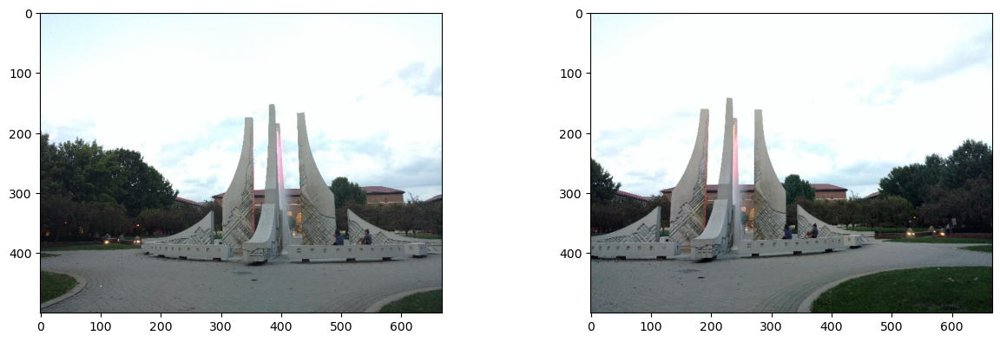

In [7]:
#displaying the two images of the same scene1
oimg1a = cv2.imread ("fountain_1.jpg")
oimg1b = cv2.imread ("fountain_2.jpg")

cimg1a = cv2.cvtColor(oimg1a, cv2.COLOR_BGR2RGB)
cimg1b = cv2.cvtColor(oimg1b, cv2.COLOR_BGR2RGB)

f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(cimg1a)
ax2.imshow(cimg1b)

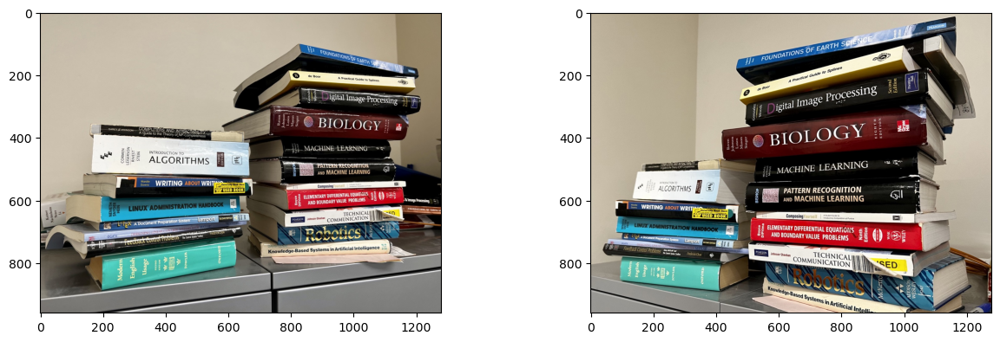

In [9]:
#displaying the two images of the same scene2
oimg2a = cv2.imread ("books_1.jpeg")
oimg2b = cv2.imread ("books_2.jpeg")

cimg2a = cv2.cvtColor(oimg2a, cv2.COLOR_BGR2RGB)
cimg2b = cv2.cvtColor(oimg2b, cv2.COLOR_BGR2RGB)

f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(cimg2a)
ax2.imshow(cimg2b)

For sigma = 0.8

True

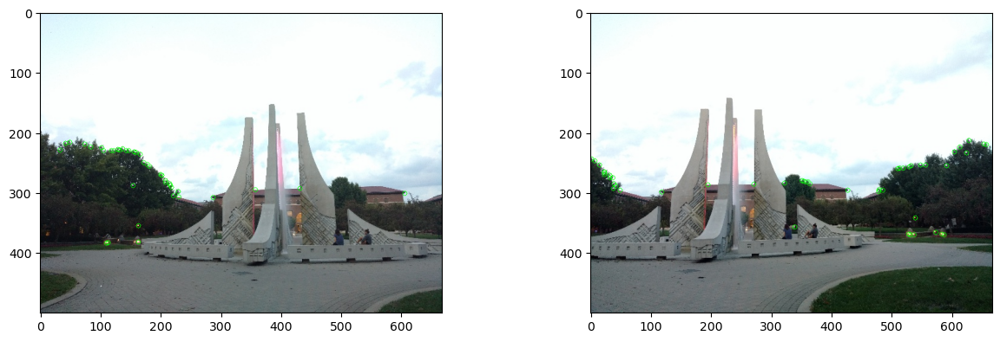

In [9]:
#Plotting the key points generated by the Harris Corner detector for image 1
sigma  = 0.8 #This is the sigma value
gimg1a = cv2.cvtColor(oimg1a, cv2.COLOR_BGR2GRAY)
coord1a = Harris(sigma,gimg1a)
rimg1a_1 = cimg1a.copy()

for x,y in coord1a:
    rimg1a_1 = cv2.circle(rimg1a_1,(y,x),4,(0,255,0))
    
gimg1b = cv2.cvtColor(oimg1b, cv2.COLOR_BGR2GRAY)
coord1b = Harris(sigma,gimg1b)
rimg1b_1 = cimg1b.copy()

for x,y in coord1b:
    rimg1b_1 = cv2.circle(rimg1b_1,(y,x),4,(0,255,0))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg1a_1)
ax2.imshow(rimg1b_1)

cv2.imwrite("hrkp1a_"+str(sigma)+".jpg",rimg1a_1)
cv2.imwrite("hrkp1b_"+str(sigma)+".jpg",rimg1b_1)
 



True

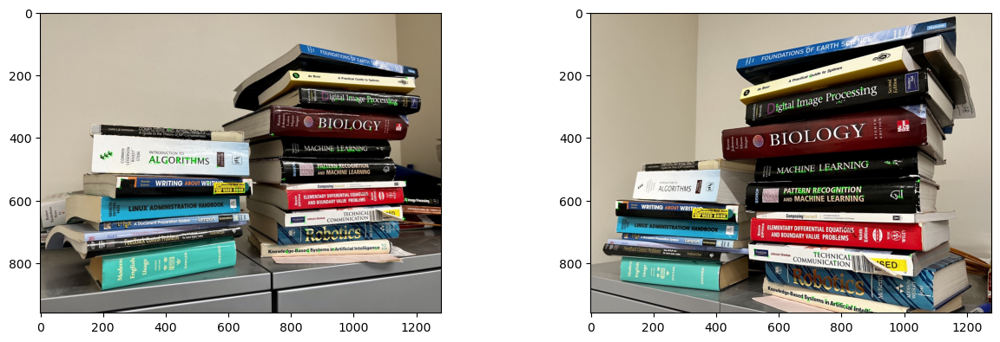

In [12]:
#Plotting the key points generated by the Harris Corner detector for image 2
sigma=0.8
gimg2a = cv2.cvtColor(oimg2a, cv2.COLOR_BGR2GRAY)
coord2a = Harris(sigma,gimg2a)
rimg2a_1 = cimg2a.copy()

for x,y in coord2a:
    rimg2a_1 = cv2.circle(rimg2a_1,(y,x),4,(0,255,0))
    
gimg2b = cv2.cvtColor(oimg2b, cv2.COLOR_BGR2GRAY)
coord2b = Harris(sigma,gimg2b)
rimg2b_1 = cimg2b.copy()

for x,y in coord2b:
    rimg2b_1 = cv2.circle(rimg2b_1,(y,x),4,(0,255,0))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg2a_1)
ax2.imshow(rimg2b_1)
 
cv2.imwrite("hrkp2a_"+str(sigma)+".jpg",rimg2a_1)
cv2.imwrite("hrkp2b_"+str(sigma)+".jpg",rimg2b_1)
 


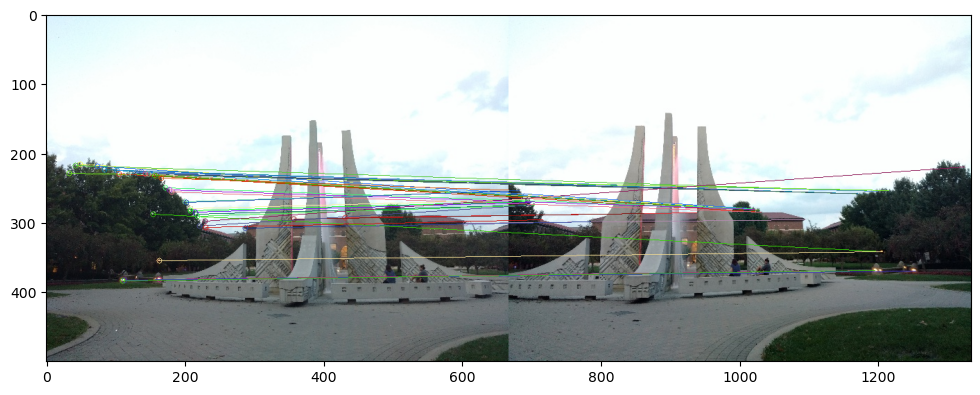

In [11]:
#Plotting the correspondences for the first image using NCC
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,0,1,sigma)

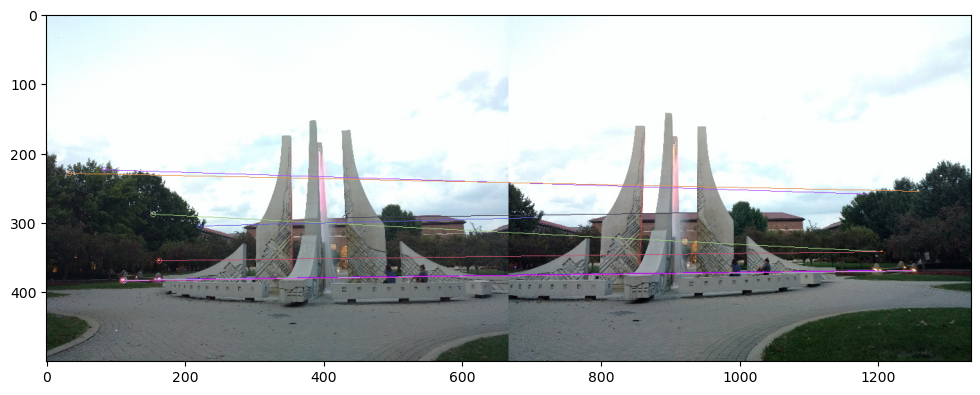

In [12]:
#Plotting the correspondences for the first image using SSD
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,1,1,sigma)

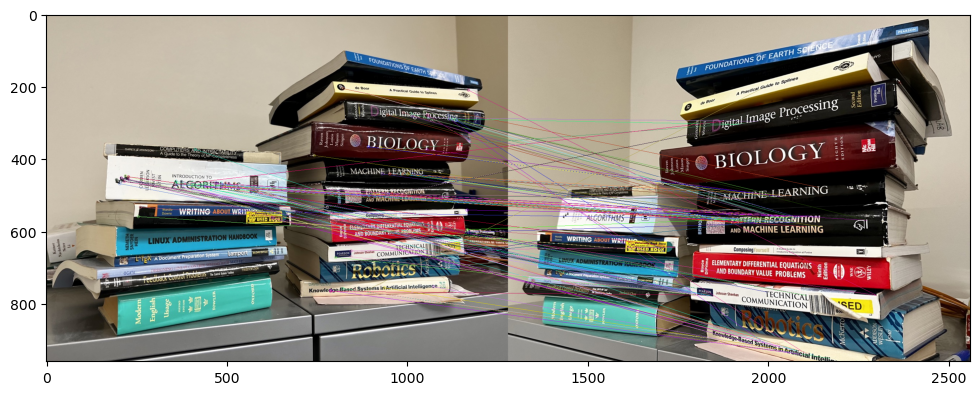

In [13]:
#Plotting the correspondences for the second image using NCC
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,0,2,sigma)

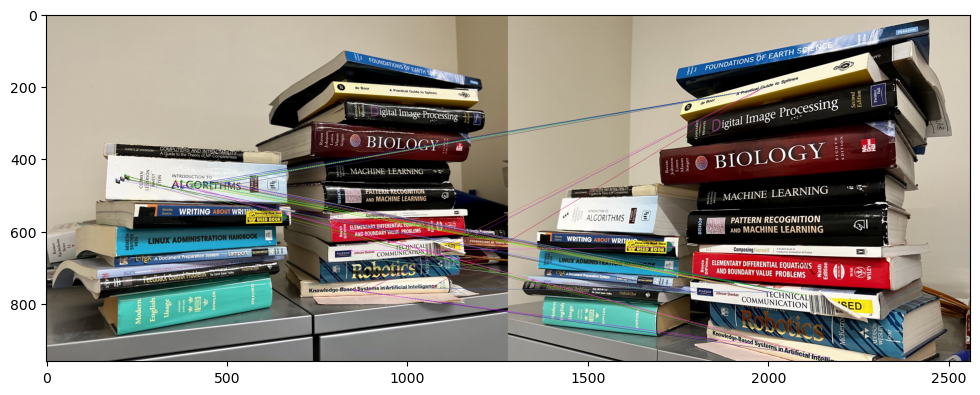

In [14]:
#Plotting the correspondences for the second image using SSD
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,1,2,sigma)

For sigma = 1.0

True

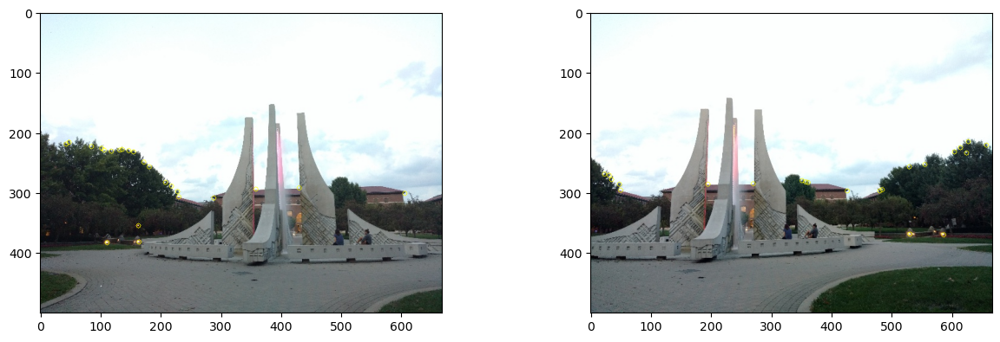

In [15]:
#Plotting the key points generated by the Harris Corner detector for image 1
sigma  = 1.0 #This is the sigma value
gimg1a = cv2.cvtColor(oimg1a, cv2.COLOR_BGR2GRAY)
coord1a = Harris(sigma,gimg1a)
rimg1a_1 = cimg1a.copy()

for x,y in coord1a:
    rimg1a_1 = cv2.circle(rimg1a_1,(y,x),4,(255,255,0))
    
gimg1b = cv2.cvtColor(oimg1b, cv2.COLOR_BGR2GRAY)
coord1b = Harris(sigma,gimg1b)
rimg1b_1 = cimg1b.copy()

for x,y in coord1b:
    rimg1b_1 = cv2.circle(rimg1b_1,(y,x),4,(255,255,0))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg1a_1)
ax2.imshow(rimg1b_1)

cv2.imwrite("hrkp1a_"+str(sigma)+".jpg",rimg1a_1)
cv2.imwrite("hrkp1b_"+str(sigma)+".jpg",rimg1b_1)
 



True

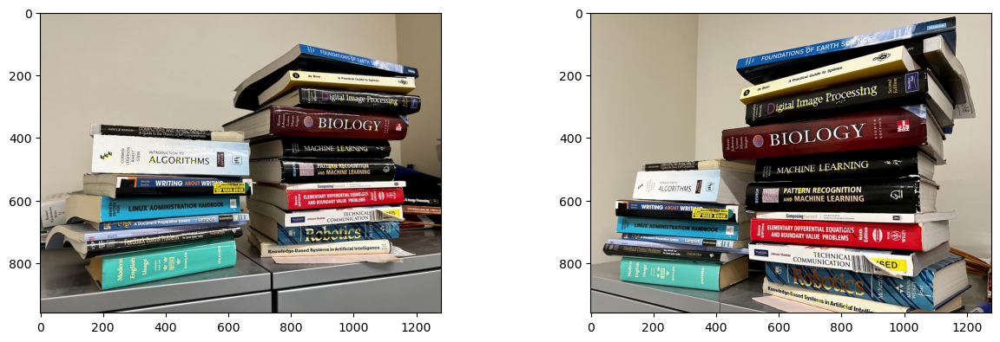

In [16]:
#Plotting the key points generated by the Harris Corner detector for image 2
gimg2a = cv2.cvtColor(oimg2a, cv2.COLOR_BGR2GRAY)
coord2a = Harris(sigma,gimg2a)
rimg2a_1 = cimg2a.copy()

for x,y in coord2a:
    rimg2a_1 = cv2.circle(rimg2a_1,(y,x),4,(255,255,0))
    
gimg2b = cv2.cvtColor(oimg2b, cv2.COLOR_BGR2GRAY)
coord2b = Harris(sigma,gimg2b)
rimg2b_1 = cimg2b.copy()

for x,y in coord2b:
    rimg2b_1 = cv2.circle(rimg2b_1,(y,x),4,(255,255,0))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg2a_1)
ax2.imshow(rimg2b_1)
 
cv2.imwrite("hrkp2a_"+str(sigma)+".jpg",rimg2a_1)
cv2.imwrite("hrkp2b_"+str(sigma)+".jpg",rimg2b_1)
 


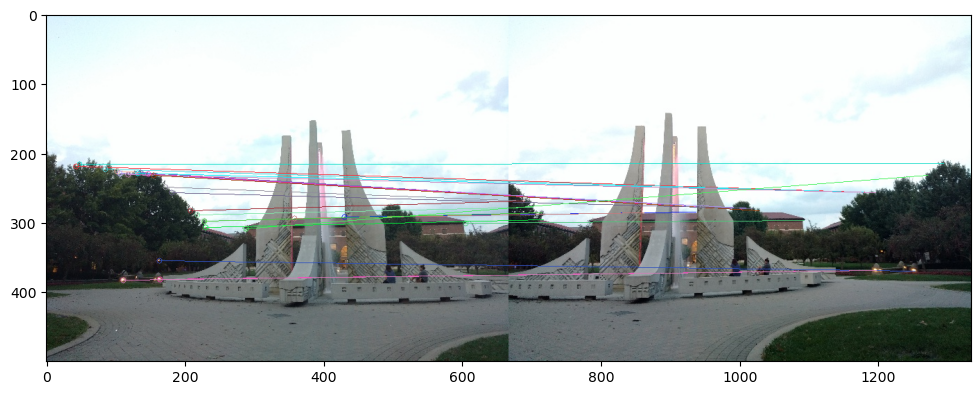

In [17]:
#Plotting the correspondences for the first image using NCC
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,0,1,sigma)

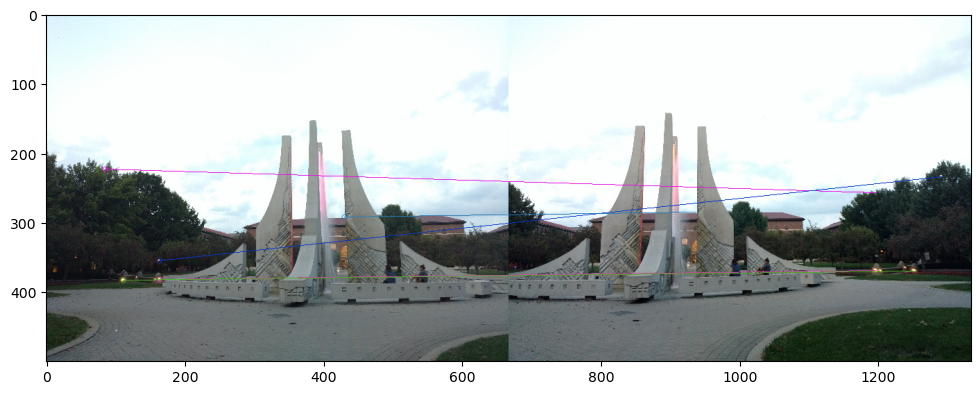

In [18]:
#Plotting the correspondences for the first image using SSD
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,1,1,sigma)

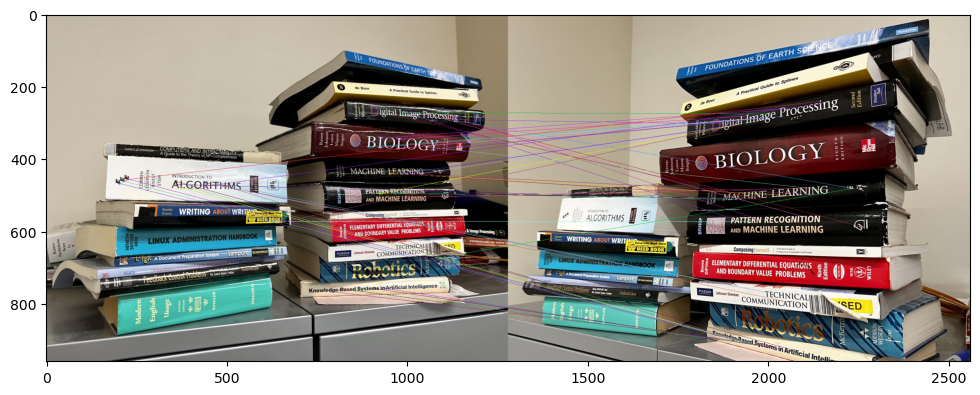

In [19]:
#Plotting the correspondences for the second image using NCC
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,0,2,sigma)

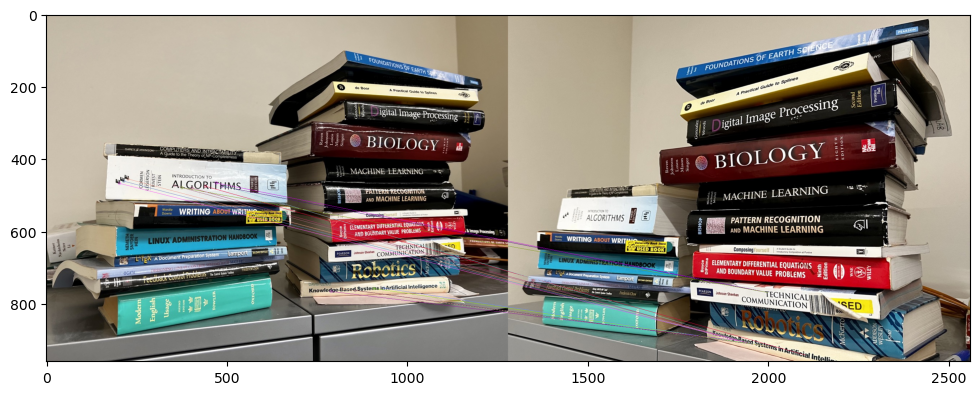

In [20]:
#Plotting the correspondences for the second image using SSD
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,1,2,sigma)

For sigma = 0.6

True

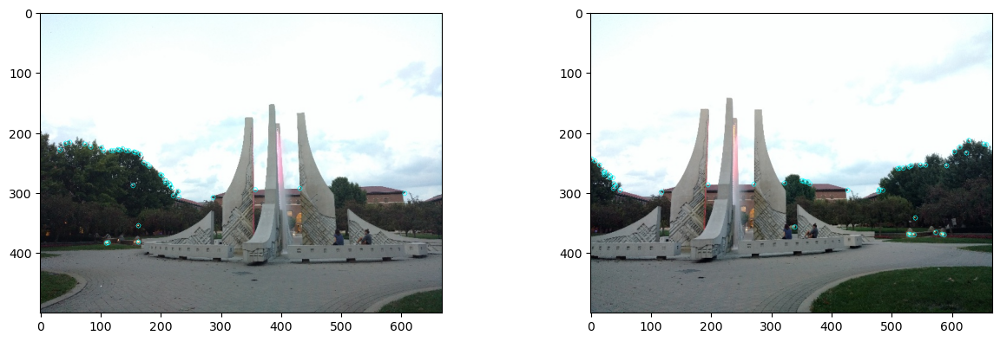

In [21]:
#Plotting the key points generated by the Harris Corner detector for image 1
sigma  = 0.6 #This is the sigma value
gimg1a = cv2.cvtColor(oimg1a, cv2.COLOR_BGR2GRAY)
coord1a = Harris(sigma,gimg1a)
rimg1a_1 = cimg1a.copy()

for x,y in coord1a:
    rimg1a_1 = cv2.circle(rimg1a_1,(y,x),4,(0,255,255))
    
gimg1b = cv2.cvtColor(oimg1b, cv2.COLOR_BGR2GRAY)
coord1b = Harris(sigma,gimg1b)
rimg1b_1 = cimg1b.copy()

for x,y in coord1b:
    rimg1b_1 = cv2.circle(rimg1b_1,(y,x),4,(0,255,255))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg1a_1)
ax2.imshow(rimg1b_1)

cv2.imwrite("hrkp1a_"+str(sigma)+".jpg",rimg1a_1)
cv2.imwrite("hrkp1b_"+str(sigma)+".jpg",rimg1b_1)
 



True

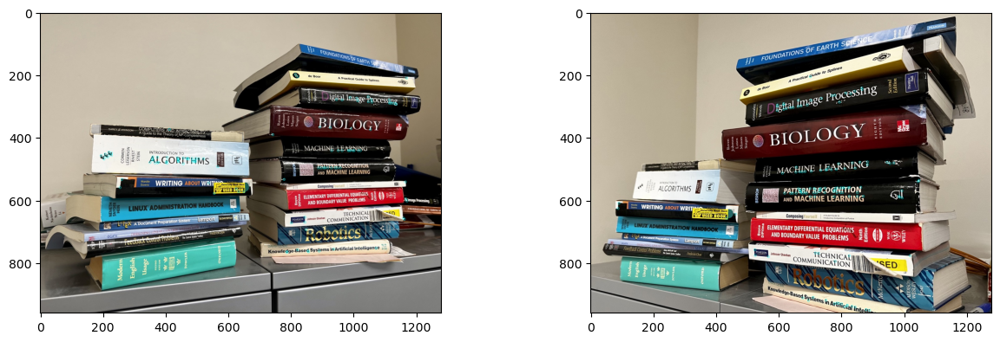

In [22]:
#Plotting the key points generated by the Harris Corner detector for image 2
gimg2a = cv2.cvtColor(oimg2a, cv2.COLOR_BGR2GRAY)
coord2a = Harris(sigma,gimg2a)
rimg2a_1 = cimg2a.copy()

for x,y in coord2a:
    rimg2a_1 = cv2.circle(rimg2a_1,(y,x),4,(0,255,255))
    
gimg2b = cv2.cvtColor(oimg2b, cv2.COLOR_BGR2GRAY)
coord2b = Harris(sigma,gimg2b)
rimg2b_1 = cimg2b.copy()

for x,y in coord2b:
    rimg2b_1 = cv2.circle(rimg2b_1,(y,x),4,(0,255,255))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg2a_1)
ax2.imshow(rimg2b_1)
 
cv2.imwrite("hrkp2a_"+str(sigma)+".jpg",rimg2a_1)
cv2.imwrite("hrkp2b_"+str(sigma)+".jpg",rimg2b_1)
 


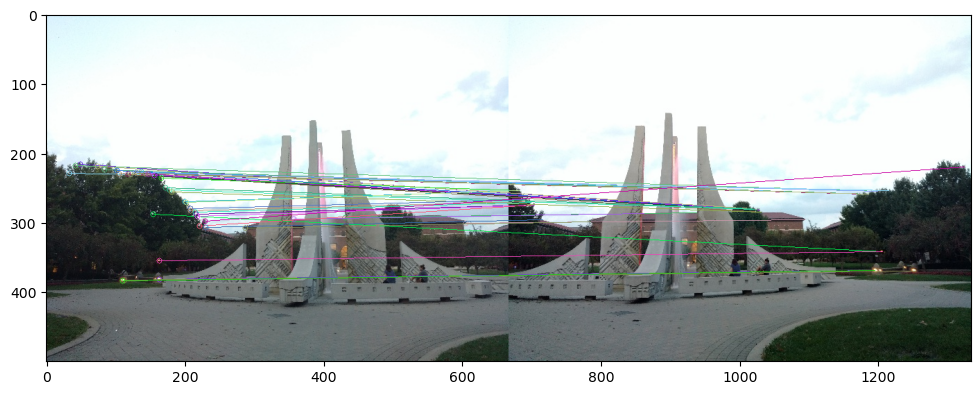

In [23]:
#Plotting the correspondences for the first image using NCC
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,0,1,sigma)

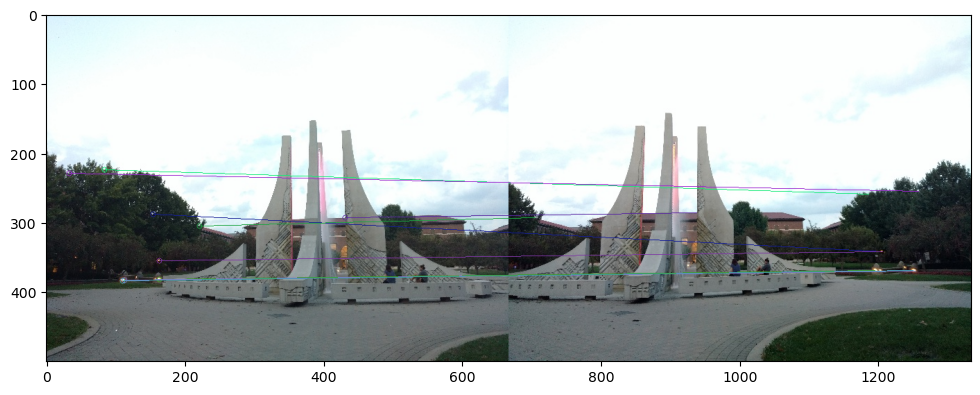

In [24]:
#Plotting the correspondences for the first image using SSD
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,1,1,sigma)

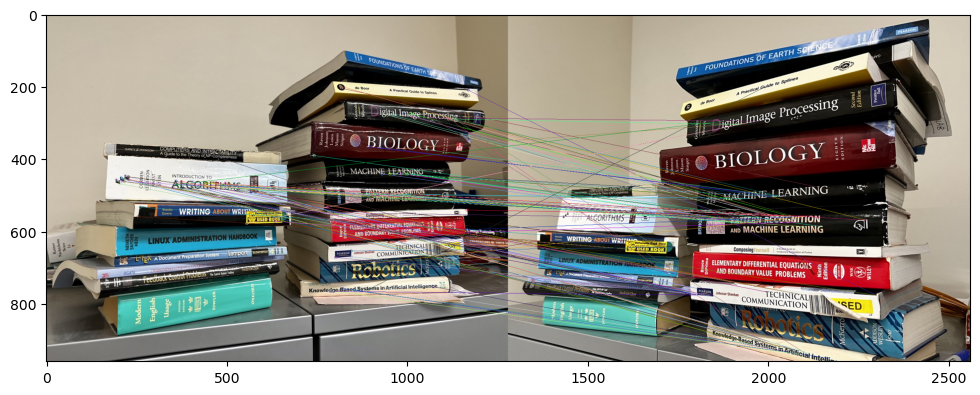

In [25]:
#Plotting the correspondences for the second image using NCC
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,0,2,sigma)

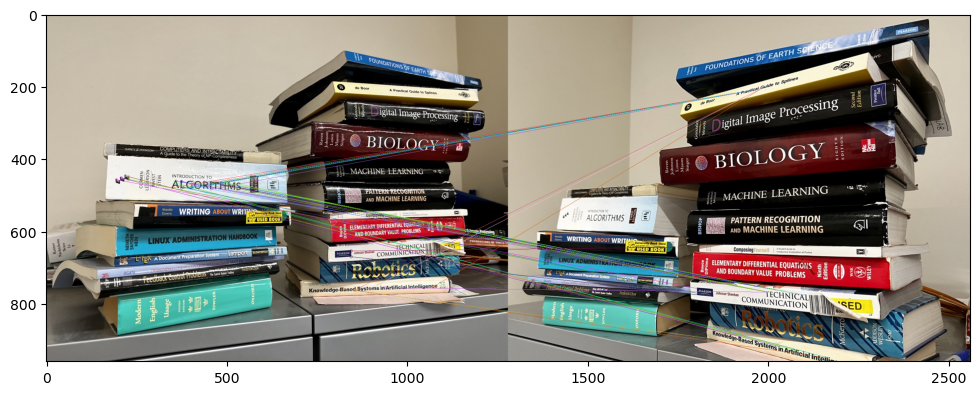

In [26]:
#Plotting the correspondences for the second image using SSD
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,1,2,sigma)

For sigma=1.2

True

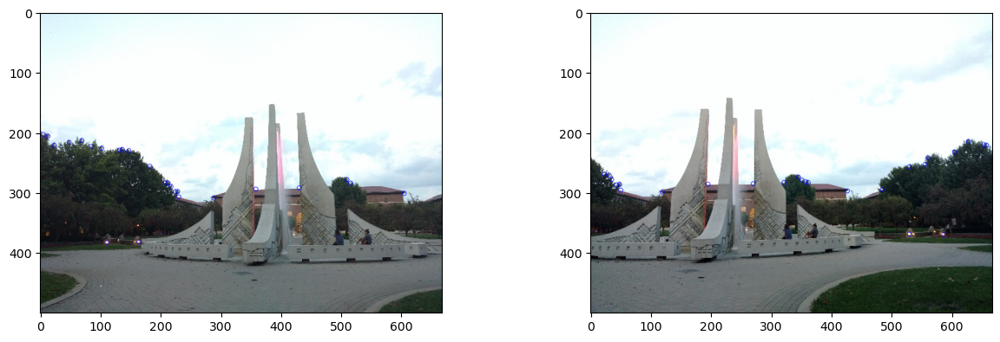

In [27]:
#Plotting the key points generated by the Harris Corner detector for image 1
sigma  = 1.2 #This is the sigma value
gimg1a = cv2.cvtColor(oimg1a, cv2.COLOR_BGR2GRAY)
coord1a = Harris(sigma,gimg1a)
rimg1a_1 = cimg1a.copy()

for x,y in coord1a:
    rimg1a_1 = cv2.circle(rimg1a_1,(y,x),4,(0,0,255))
    
gimg1b = cv2.cvtColor(oimg1b, cv2.COLOR_BGR2GRAY)
coord1b = Harris(sigma,gimg1b)
rimg1b_1 = cimg1b.copy()

for x,y in coord1b:
    rimg1b_1 = cv2.circle(rimg1b_1,(y,x),4,(0,0,255))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg1a_1)
ax2.imshow(rimg1b_1)

cv2.imwrite("hrkp1a_"+str(sigma)+".jpg",rimg1a_1)
cv2.imwrite("hrkp1b_"+str(sigma)+".jpg",rimg1b_1)
 



True

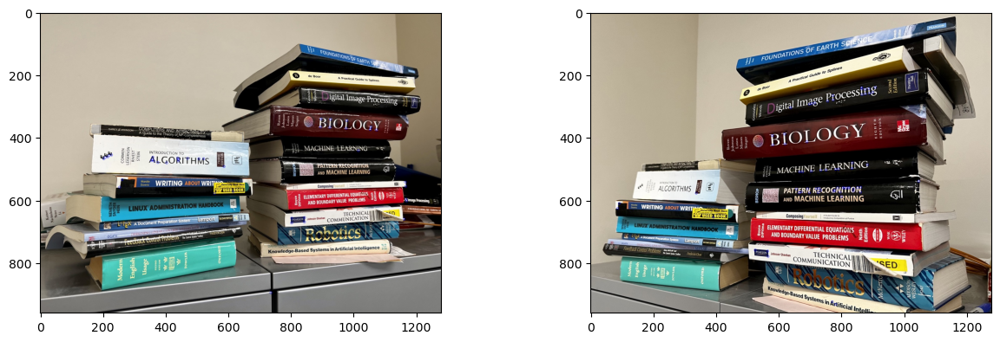

In [28]:
#Plotting the key points generated by the Harris Corner detector for image 2
gimg2a = cv2.cvtColor(oimg2a, cv2.COLOR_BGR2GRAY)
coord2a = Harris(sigma,gimg2a)
rimg2a_1 = cimg2a.copy()

for x,y in coord2a:
    rimg2a_1 = cv2.circle(rimg2a_1,(y,x),4,(0,0,255))
    
gimg2b = cv2.cvtColor(oimg2b, cv2.COLOR_BGR2GRAY)
coord2b = Harris(sigma,gimg2b)
rimg2b_1 = cimg2b.copy()

for x,y in coord2b:
    rimg2b_1 = cv2.circle(rimg2b_1,(y,x),4,(0,0,255))
    
f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)
ax1.imshow(rimg2a_1)
ax2.imshow(rimg2b_1)
 
cv2.imwrite("hrkp2a_"+str(sigma)+".jpg",rimg2a_1)
cv2.imwrite("hrkp2b_"+str(sigma)+".jpg",rimg2b_1)
 


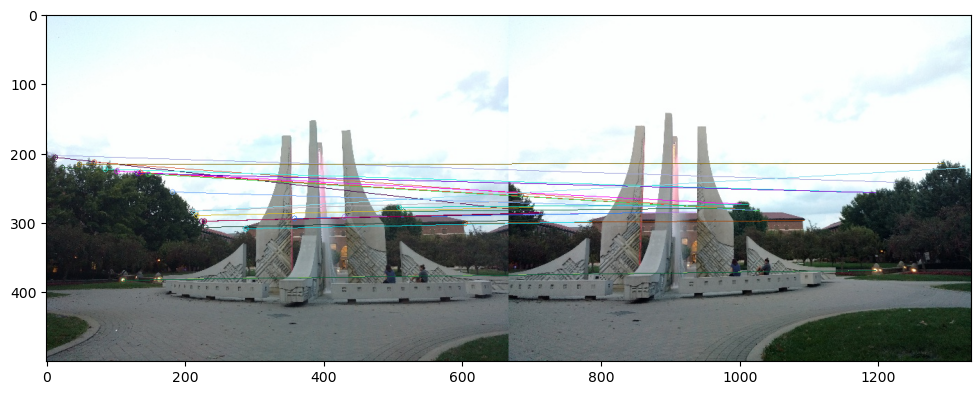

In [29]:
#Plotting the correspondences for the first image using NCC
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,0,1,sigma)

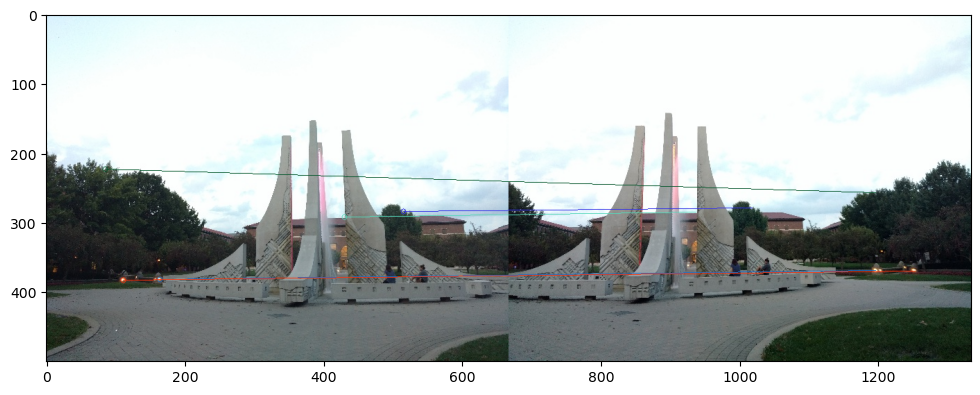

In [30]:
#Plotting the correspondences for the first image using SSD
rimg1a_2 = cimg1a.copy()
rimg1b_2 = cimg1b.copy()
Correspondence(rimg1a_2,coord1a,rimg1b_2,coord1b,10,1,1,sigma)

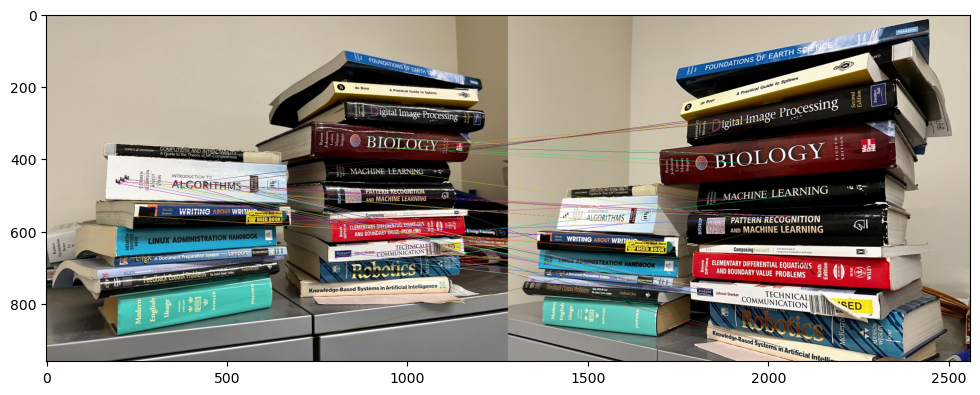

In [31]:
#Plotting the correspondences for the second image using NCC
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,0,2,sigma)

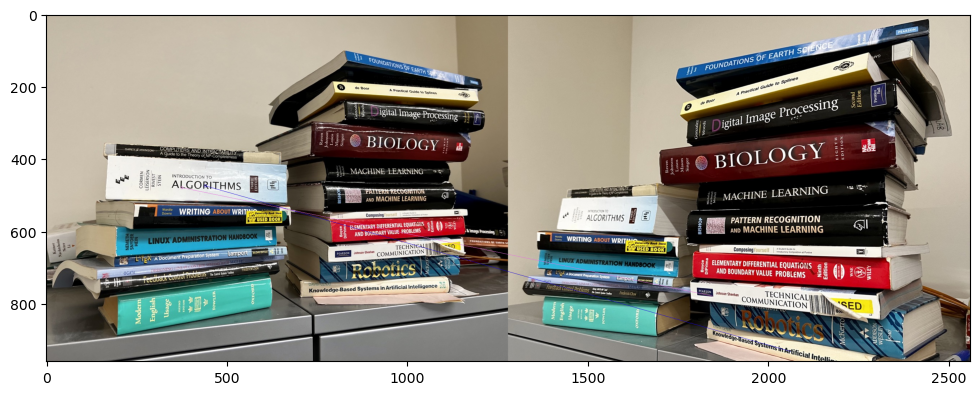

In [32]:
#Plotting the correspondences for the second image using SSD
rimg2a_2 = cimg2a.copy()
rimg2b_2 = cimg2b.copy()
Correspondence(rimg2a_2,coord2a,rimg2b_2,coord2b,10,1,2,sigma)

True

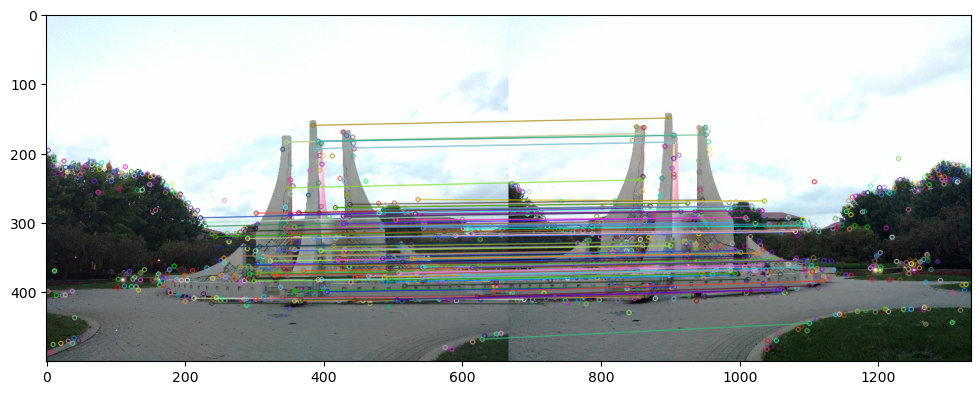

In [33]:
#Task 4.1.2 for the first image
gimg1a_3 = gimg1a.copy()
gimg1b_3 = gimg1b.copy()

cimg1a_3 = cimg1a.copy()
cimg1b_3 = cimg1b.copy()

sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(gimg1a_3,None)
kp2, des2 = sift.detectAndCompute(gimg1b_3,None)


bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# The ratio test
good = []
for m,n in matches:
    if m.distance < 0.5*n.distance:
        good.append([m])
img31 = cv2.drawMatchesKnn(cimg1a_3,kp1,cimg1b_3,kp2,good, None,matchColor=(-1, -1, -1), matchesMask=None,singlePointColor=(-1, -1, -1), flags=0)

f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(111)

ax1.imshow(img31)
cv2.imwrite("sift1_.jpg",img31)

True

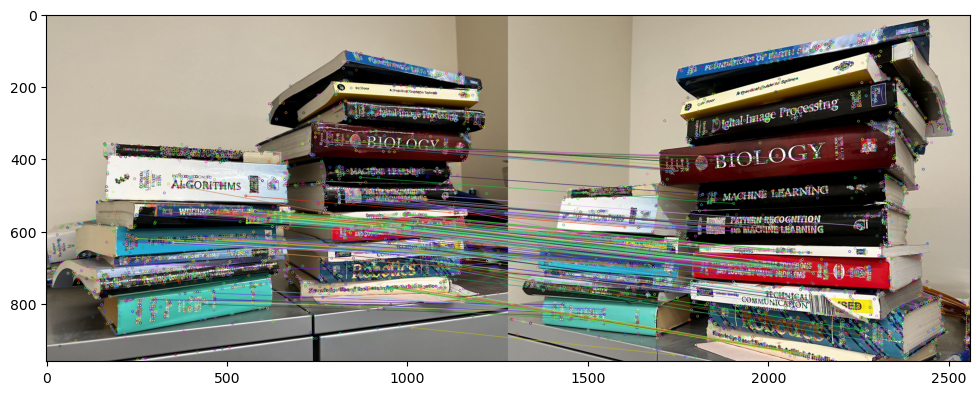

In [15]:
#Task 4.1.2 for the second image
gimg2a_3 = gimg2a.copy()
gimg2b_3 = gimg2b.copy()

cimg2a_3 = cimg2a.copy()
cimg2b_3 = cimg2b.copy()

sift2 = cv2.SIFT_create()

kp21, des21 = sift2.detectAndCompute(gimg2a_3,None)
kp22, des22 = sift2.detectAndCompute(gimg2b_3,None)


bf2 = cv2.BFMatcher()
matches2 = bf2.knnMatch(des21,des22, k=2)

# The ratio test
good2 = []
for m,n in matches2:
    if m.distance < 0.5*n.distance:
        good2.append([m])

img32 = cv2.drawMatchesKnn(cimg2a_3,kp21,cimg2b_3,kp22,good2, None, matchColor=(-1, -1, -1), matchesMask=None,singlePointColor=(-1, -1, -1), flags=0)

f = plt.figure(figsize=(15,4.5))
ax1 = f.add_subplot(111)

ax1.imshow(img32)
cv2.imwrite("sift2_.jpg",img32)